# Computer HW2 - Yair Nadler

Libraries to be used throughout the code

In [2]:
import numpy as np
import skimage 
from skimage import io, filters, feature, morphology, util
import scipy as sp
import scipy.ndimage as nd
import cv2 as cv
import matplotlib.pyplot as plt


General image methods to be used throughout the code

In [116]:
def negative_image(img):
    """Creating a negative image of the input image by applying NOT operation on each pixel of the image."""
    return np.bitwise_not(img)

## Part 1 - Spatial Filtering and Morphological Operations

### Morphological Operation

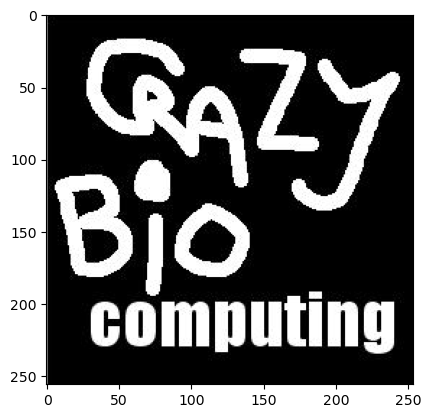

In [4]:
# load crazeBioComp image
crazyBioComp = io.imread('../crazyBioComp.jpg', as_gray=True)

# show the image
plt.imshow(crazyBioComp, cmap='gray')

Performing the 6 operations we learned on the crayBioComputing image

In [5]:
def erosion(img):
    """performs erosion on a binary image"""
    # create a rectangle structuring element
    rectangle = morphology.rectangle(5, 10)
    # perform erosion
    eroded_img = morphology.erosion(img, selem = rectangle)
    return eroded_img

def dialation(img):
    """performs dialation on a binary image"""
    # create a square structuring element
    square = morphology.square(3)
    # perform dialation
    dialated_img = morphology.dilation(img, selem = square)
    return dialated_img

def opening(img):
    """performs opening on a binary image"""
    # create a diamond structuring element
    diamond = morphology.diamond(5)
    # perform opening
    opened_img = morphology.opening(img, selem = diamond)
    return opened_img

def closing(img):
    """performs closing on a binary image"""
    # create a disk structuring element
    disk = morphology.disk(2)
    # perform closing
    closed_img = morphology.closing(img, selem = disk)
    return closed_img

def top_hat(img):
    """performs top hat on a binary image"""
    # create a disk structuring element
    disk = morphology.disk(5)
    # perform top hat
    img_opened = morphology.opening(img, selem = disk)
    top_hat_img = img - img_opened
    return top_hat_img

def bottom_hat(img):
    """performs bottom hat on a binary image"""
    # create a square structuring element
    square = morphology.square(5)
    # perform bottom hat
    img_closed = morphology.closing(img, selem = square)
    bottom_hat_img = img_closed - img
    return bottom_hat_img


In [6]:
def morphology_ops(img):
    """performs all the morphological operations on a binary image and plots them"""
    # perform erosion
    eroded_img = erosion(img)
    # perform dialation
    dialated_img = dialation(img)
    # perform opening
    opened_img = opening(img)
    # perform closing
    closed_img = closing(img)
    # perform top hat
    top_hat_img = top_hat(img)
    # perform bottom hat
    bottom_hat_img = bottom_hat(img)
    # plot the images
    fig, axes = plt.subplots(2, 3, figsize=(8, 8))
    ax = axes.ravel()
    ax[0].imshow(eroded_img, cmap='gray')
    ax[0].set_title("Erosion")
    ax[1].imshow(dialated_img, cmap='gray')
    ax[1].set_title("Dialation")
    ax[2].imshow(opened_img, cmap='gray')
    ax[2].set_title("Opening")
    ax[3].imshow(closed_img, cmap='gray')
    ax[3].set_title("Closing")
    ax[4].imshow(top_hat_img, cmap='gray')
    ax[4].set_title("Top Hat")
    ax[5].imshow(bottom_hat_img, cmap='gray')
    ax[5].set_title("Bottom Hat")
    for a in ax:
        a.axis('off')
    fig.tight_layout()
    plt.show()

C:\Users\yn_so\AppData\Local\Temp\ipykernel_16400\2122909758.py:6: FutureWarning: `selem` is a deprecated argument name for `erosion`. It will be removed in version 1.0. Please use `footprint` instead.
  eroded_img = morphology.erosion(img, selem = rectangle)
C:\Users\yn_so\AppData\Local\Temp\ipykernel_16400\2122909758.py:14: FutureWarning: `selem` is a deprecated argument name for `dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  dialated_img = morphology.dilation(img, selem = square)
c:\Users\yn_so\anaconda3\envs\ImageProccessing\lib\site-packages\skimage\_shared\utils.py:274: FutureWarning: `selem` is a deprecated argument name for `opening`. It will be removed in version 1.0. Please use `footprint` instead.
  warnings.warn(self.warning_msg.format(
c:\Users\yn_so\anaconda3\envs\ImageProccessing\lib\site-packages\skimage\_shared\utils.py:274: FutureWarning: `selem` is a deprecated argument name for `closing`. It will be removed in version 1.0. Please us

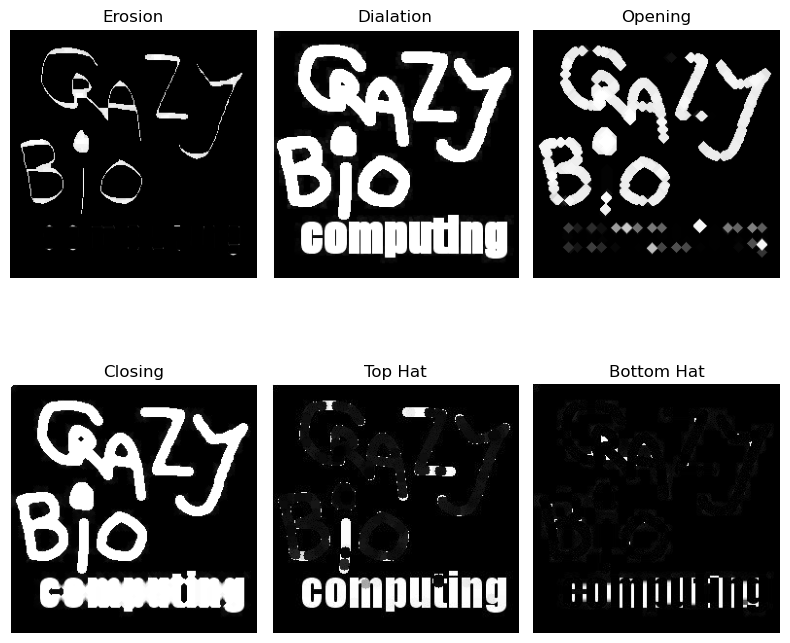

In [7]:
# perform all the morphological operations on the image
morphology_ops(crazyBioComp)

Text(0.5, 1.0, 'keyboard image')

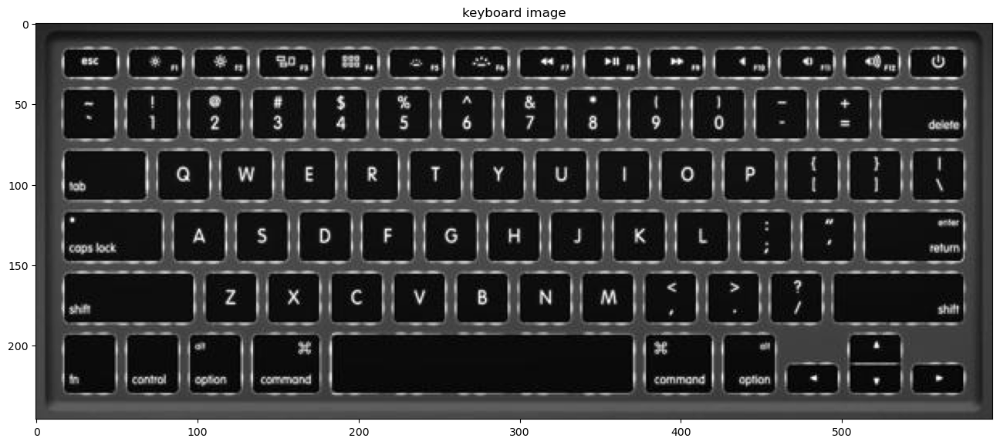

In [106]:
# loading keyboard image
keyboard = io.imread('../keyboard.jpg', as_gray=True)

# show the image
fig = plt.figure(figsize = (16,8))
title = "keyboard image"
plt.imshow(keyboard, cmap="gray")
plt.title(title)

creating the structural elements and applying erosion with the vertical and horizontal elements on the keyboard image

Text(0.5, 1.0, 'Eroded image, with respect to columns.')

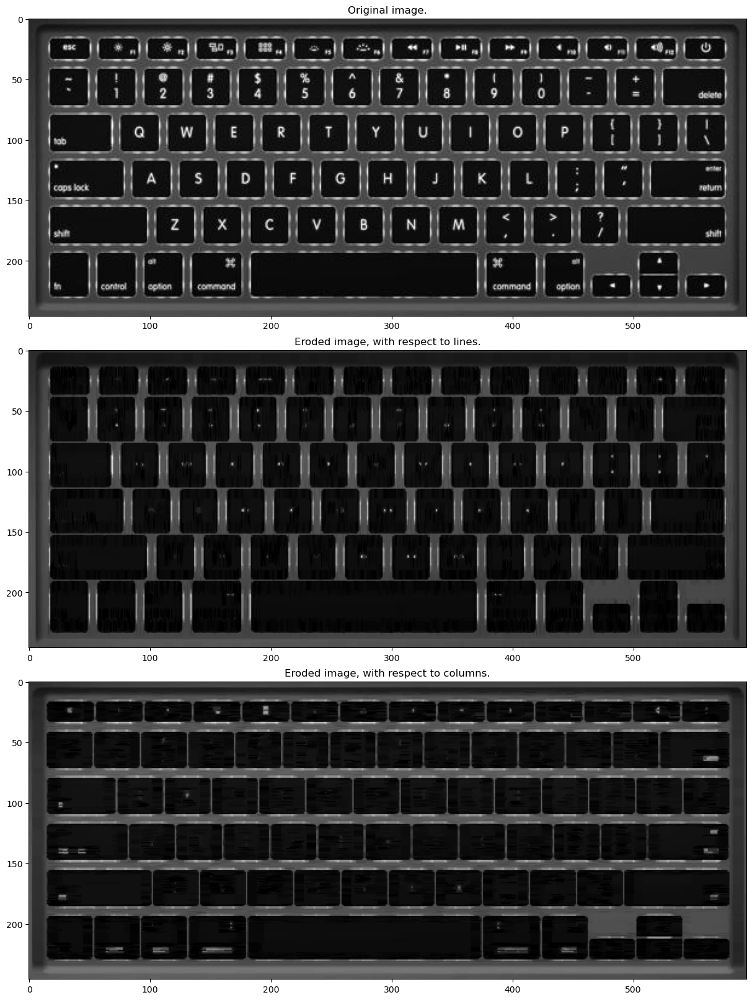

In [170]:
# creating vertical structuring element
vertical = cv.getStructuringElement(cv.MORPH_RECT, (1, 8))

# creating horizontal structuring element
horizontal = cv.getStructuringElement(cv.MORPH_RECT, (8, 1))

#creating square structuring element
square = cv.getStructuringElement(cv.MORPH_RECT, (8, 8))

# applying the erosion with the vertical and horizontal structuring elements on the keyboard image
vertical_keyboard = cv.erode(keyboard, vertical, iterations = 1)
horizontal_keyboard = cv.erode(keyboard, horizontal, iterations = 1)

# show the images
fig, axs = plt.subplots(3,1,constrained_layout=True,figsize = (16,16))
title = "Original image."
axs[0].imshow(keyboard, cmap="gray")
axs[0].set_title(title)
title = "Eroded image, with respect to lines."
axs[1].imshow(vertical_keyboard, cmap="gray")
axs[1].set_title(title)
title = "Eroded image, with respect to columns."
axs[2].imshow(horizontal_keyboard, cmap="gray")
axs[2].set_title(title)

Adding the two images together and applying 0.2 threshold

Text(0.5, 1.0, 'Thresholded image.')

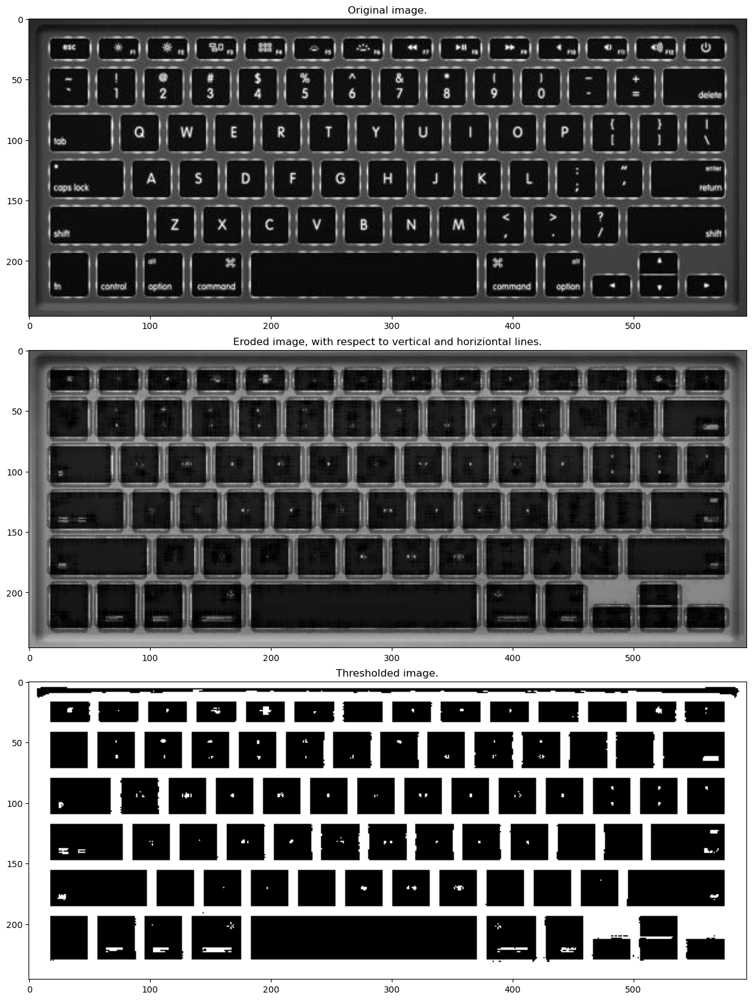

In [171]:
# adding the to images to get the final image
sum_keyboard = vertical_keyboard + horizontal_keyboard

# applying the threshold to the final image
keyboard_threshold = cv.threshold(sum_keyboard, 255 * 0.2, 255, cv.THRESH_BINARY)[1]

# show the images
fig, axs = plt.subplots(3,1,constrained_layout=True,figsize = (16,16))
title = "Original image."
axs[0].imshow(keyboard, cmap="gray")
axs[0].set_title(title)
title = "Eroded image, with respect to vertical and horiziontal lines."
axs[1].imshow(sum_keyboard, cmap="gray")
axs[1].set_title(title)
title = "Thresholded image."
axs[2].imshow(keyboard_threshold, cmap="gray")
axs[2].set_title(title)

### Filtering

Creating a negative picture of the threshold keyboard and applying a median fitler to it

Text(0.5, 1.0, 'Median filtered image.')

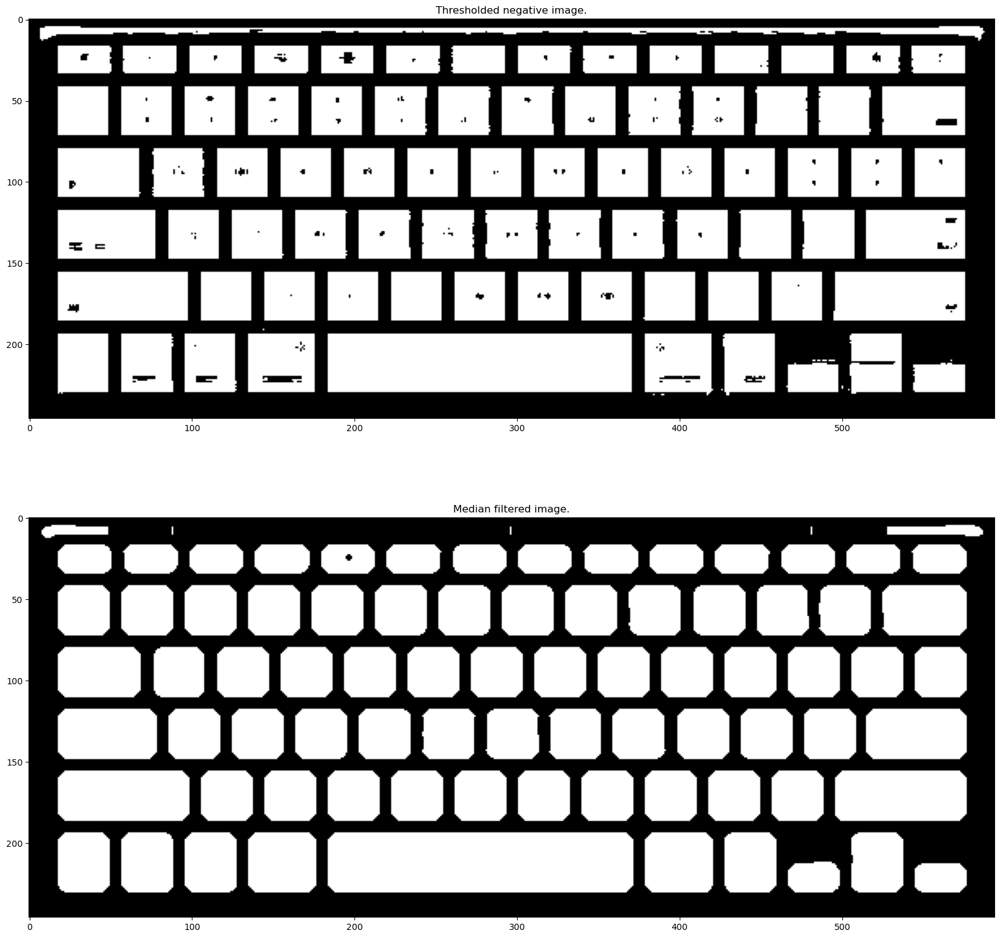

In [172]:
# creating a negative image of the thresholded image
negative_keyboard_threshold = negative_image(keyboard_threshold.astype(np.uint8))

# applying an 8x8 median filter to the negative image
median_filtered_negative_keyboard_threshold = nd.median_filter(negative_keyboard_threshold, size = 8)

# show the images
fig, axs = plt.subplots(2,1,constrained_layout=True,figsize = (16,16))
title = "Thresholded negative image."
axs[0].imshow(negative_keyboard_threshold, cmap="gray")
axs[0].set_title(title)
title = "Median filtered image."
axs[1].imshow(median_filtered_negative_keyboard_threshold, cmap="gray")
axs[1].set_title(title)

### More Morphological Opertions

Applying morphological erosion with the 8x8 square element created previously

Text(0.5, 1.0, 'Square filtered image.')

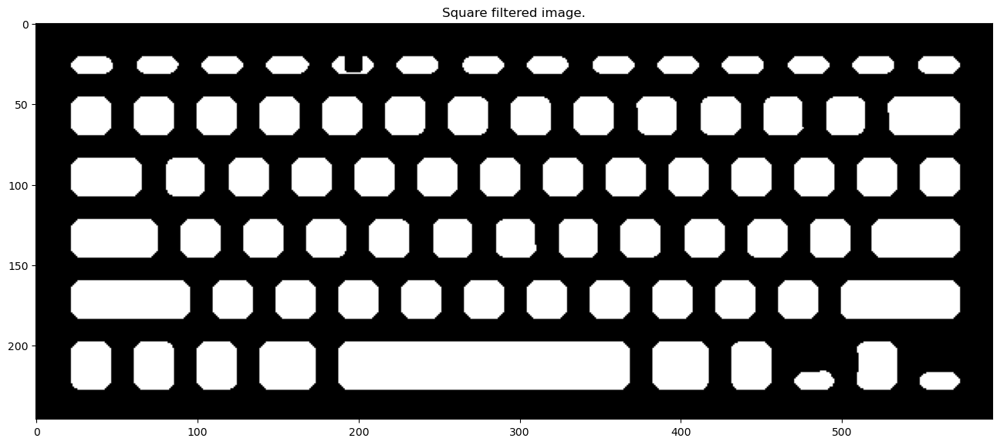

In [173]:
# applying the square filter to the median filtered image
square_filtered_median_filtered_negative_keyboard_threshold = cv.erode(median_filtered_negative_keyboard_threshold, square, iterations = 1)

# show the image
fig = plt.figure(figsize = (16,8))
title = "Square filtered image."
plt.imshow(square_filtered_median_filtered_negative_keyboard_threshold, cmap="gray")
plt.title(title)

Performing cut operation between the recieved square filtered image and the original image, and sharpening the produced image

Text(0.5, 1.0, 'Intersection image')

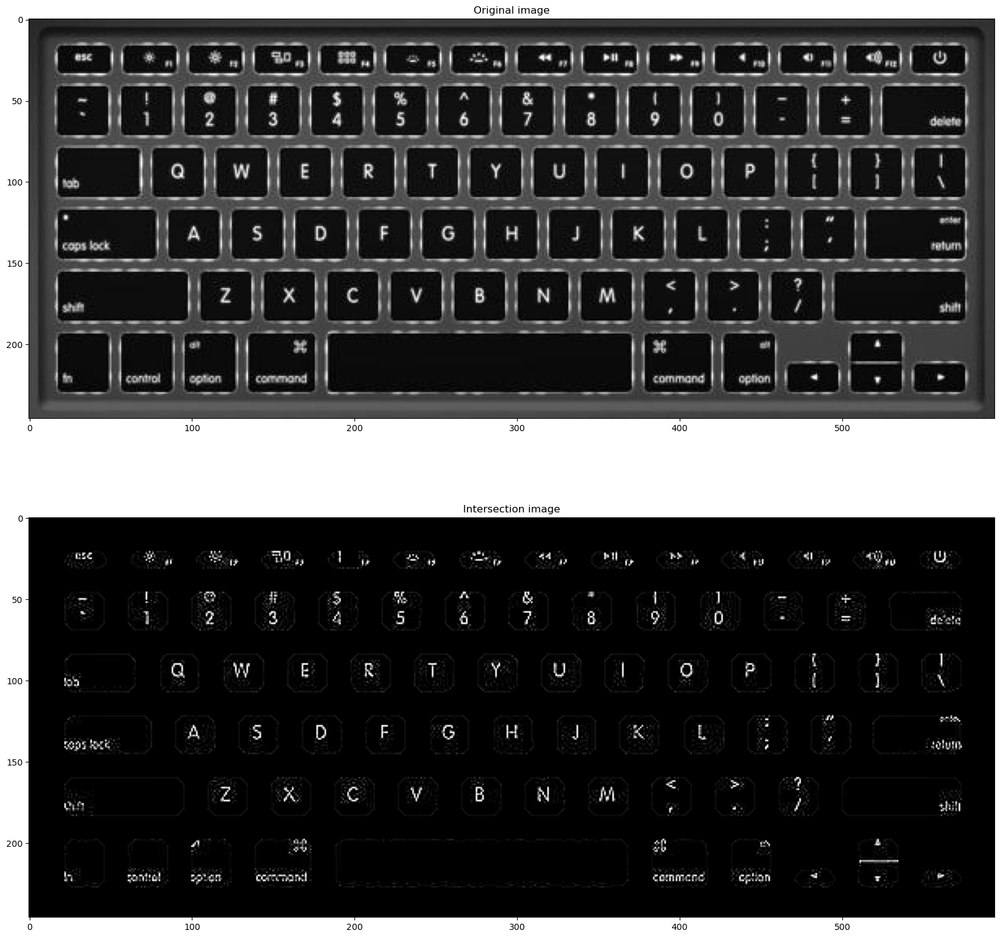

In [174]:
# performing the intersection of the square filtered image and the keyboard image
intersect_keyboard = cv.bitwise_and(square_filtered_median_filtered_negative_keyboard_threshold, keyboard)

# sharpen image
sharpening_filter = np.array([[0,-1,0], [-1,4,-1], [0,-1,0]])
sharpened_intersect_keyboard = cv.filter2D(intersect_keyboard, -1, sharpening_filter)

# show the images
fig, axs = plt.subplots(2,1,constrained_layout=True,figsize = (16,16))
title = "Original image"
axs[0].imshow(keyboard, cmap="gray")
axs[0].set_title(title)
title = "Intersection image"
axs[1].imshow(sharpened_intersect_keyboard, cmap="gray")
axs[1].set_title(title)


Applying another threshold to the image

Text(0.5, 1.0, 'Thresholded sharpened image.')

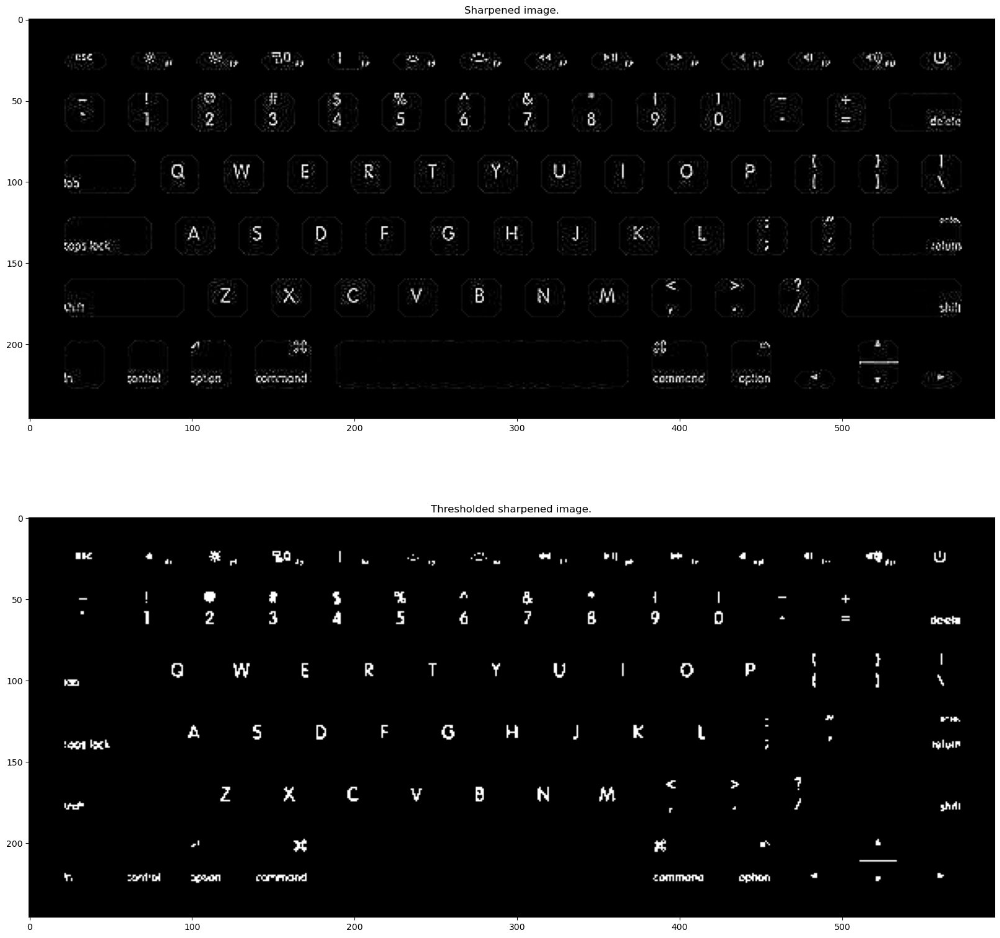

In [179]:
# applying the threshold to the sharpened image
sharpened_cut_keyboard_threshold = cv.threshold(intersect_keyboard, 125, 255, cv.THRESH_BINARY)[1]

# show the images
fig, axs = plt.subplots(2,1,constrained_layout=True,figsize = (16,16))
title = "Sharpened image."
axs[0].imshow(sharpened_intersect_keyboard, cmap="gray")
axs[0].set_title(title)
title = "Thresholded sharpened image."
axs[1].imshow(sharpened_cut_keyboard_threshold, cmap="gray")
axs[1].set_title(title)


## Part 2 - Template Matching

Creating the SSD

In [2]:
def SSD(image, template):
    # initalize the ssd
    ssd = np.inf
    for y in range(image.shape[0]):
        for x in range(image.shape[1]):
            patch = image[y:y+template.shape[0], x:x+template.shape[1]]
            # if the path is not the same size as the template, put infinity in the ssd
            if (patch.shape != template.shape):
                temp_ssd = np.inf
            else:
                diff = (template - patch)**2
                temp_ssd = np.sum(diff)
            # if the ssd is smaller than the previous ssd, update the ssd
            if (temp_ssd < ssd):
                ssd = temp_ssd
    return ssd 

Find the font size of the Edgar Allen Poe text using template matching

Text(0.5, 1.0, 'E16 image.')

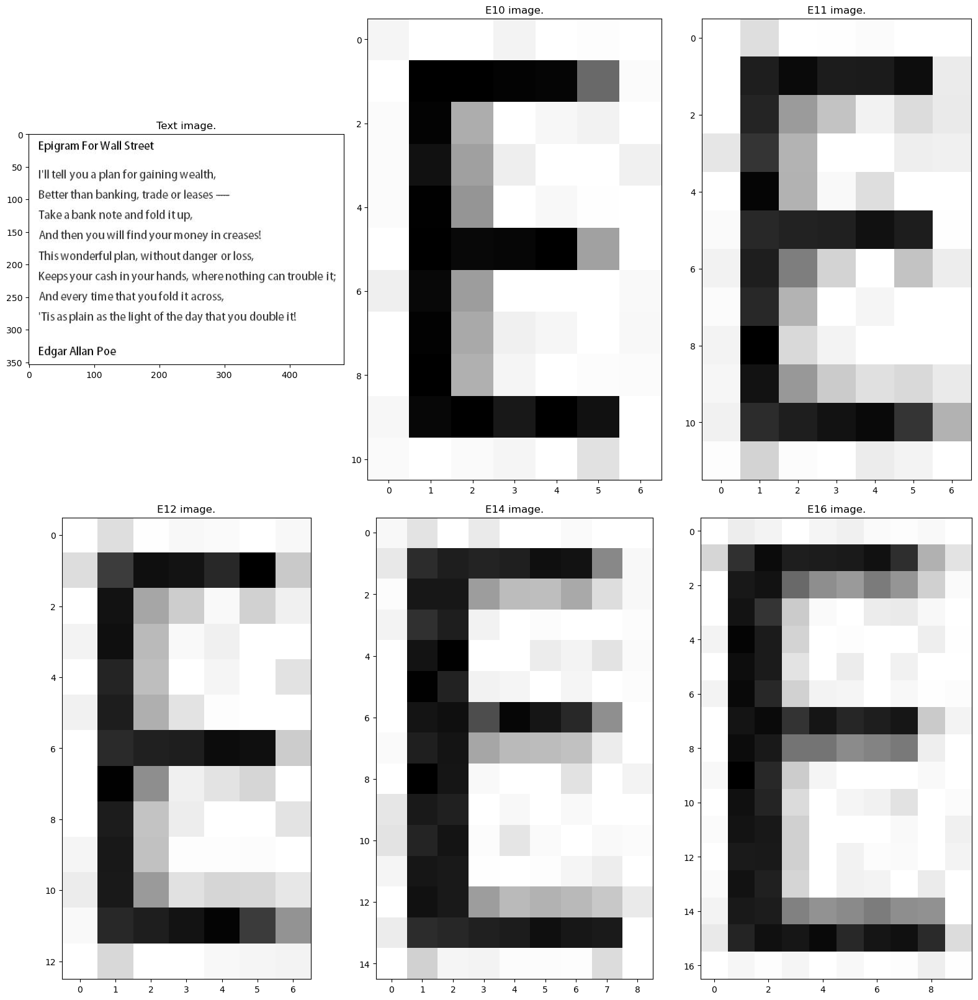

In [3]:
# Load the images
text = io.imread('../text.jpg', as_gray=True)
E10 = io.imread('../E10.jpg', as_gray=True)
E11 = io.imread('../E11.jpg', as_gray=True)
E12 = io.imread('../E12.jpg', as_gray=True)
E14 = io.imread('../E14.jpg', as_gray=True)
E16 = io.imread('../E16.jpg', as_gray=True)

# turn all the images to double
text = text.astype(np.double)
E10 = E10.astype(np.double)
E11 = E11.astype(np.double)
E12 = E12.astype(np.double)
E14 = E14.astype(np.double)
E16 = E16.astype(np.double)

# show the images
fig, axs = plt.subplots(2,3,constrained_layout=True,figsize = (16,16))
title = "Text image."
axs[0,0].imshow(text, cmap="gray")
axs[0,0].set_title(title)
title = "E10 image."
axs[0,1].imshow(E10, cmap="gray")
axs[0,1].set_title(title)
title = "E11 image."
axs[0,2].imshow(E11, cmap="gray")
axs[0,2].set_title(title)
title = "E12 image."
axs[1,0].imshow(E12, cmap="gray")
axs[1,0].set_title(title)
title = "E14 image."
axs[1,1].imshow(E14, cmap="gray")
axs[1,1].set_title(title)
title = "E16 image."
axs[1,2].imshow(E16, cmap="gray")
axs[1,2].set_title(title)

In [4]:
# creating the SSD dictionary
SSD_dictionary = {
    0: 10,
    1: 11,
    2: 12,
    3: 14,
    4: 16
}
# find the best matching font using the SSD
SSD_text_E10 = SSD(text, E10)
SSD_text_E11 = SSD(text, E11)
SSD_text_E12 = SSD(text, E12)
SSD_text_E14 = SSD(text, E14)
SSD_text_E16 = SSD(text, E16)
best_matching_font = np.argmin([SSD_text_E10, SSD_text_E11, SSD_text_E12, SSD_text_E14, SSD_text_E16])

In [5]:
print("The font size is:", SSD_dictionary[best_matching_font])

The font size is: 14


Finding how many times the letters 'a' and 't' appear in the text, in both capital and non-capital form

Text(0.5, 1.0, 'T template')

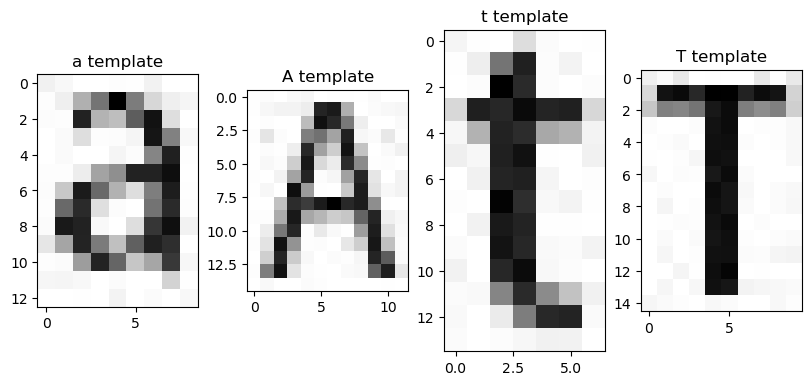

In [6]:
# load the template images
a_in_text = io.imread('../a_in_text.jpg', as_gray=True)
capitalA_in_text = io.imread('../capitalA_in_text.jpg', as_gray=True)
t_in_text = io.imread('../t_in_text.jpg', as_gray=True)
capitalT_in_text = io.imread('../capitalT_in_text.jpg', as_gray=True)

# show the template images
fig, axs = plt.subplots(1,4,constrained_layout=True,figsize = (8,8))
title = "a template"
axs[0].imshow(a_in_text, cmap="gray")
axs[0].set_title(title)
title = "A template"
axs[1].imshow(capitalA_in_text, cmap="gray")
axs[1].set_title(title)
title = "t template"
axs[2].imshow(t_in_text, cmap="gray")
axs[2].set_title(title)
title = "T template"
axs[3].imshow(capitalT_in_text, cmap="gray")
axs[3].set_title(title)


In [7]:
# finding the SSDs
SSD_a = SSD(text, a_in_text)
SSD_capitalA = SSD(text, capitalA_in_text)
SSD_t = SSD(text, t_in_text)
SSD_capitalT = SSD(text, capitalT_in_text)


In [8]:
# creating threshold for the SSDs
a_threshold = np.floor(SSD_a * 1.0789) - 400
capitalA_threshold = np.ceil(SSD_capitalA * 1.01)
t_threshold = np.floor(SSD_t * 1.085)
capitalT_threshold = np.floor(SSD_capitalT * 1.03)

In [9]:
def count_characters(img, template, threshold):
    """counts the characters in the image by moving the template over the image and counting the number of times the SSD is smaller than the threshold"""
    # initalize the counter
    counter = 0
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            patch = img[y:y+template.shape[0], x:x+template.shape[1]]
            # if the path is not the same size as the template, put infinity in the ssd
            if (patch.shape != template.shape):
                temp_ssd = np.inf
            else:
                diff = (template - patch)**2
                temp_ssd = np.sum(diff)
            # if the ssd is smaller than the threshold, update the counter
            if (temp_ssd < threshold):
                counter += 1
    return counter

In [10]:
# counting the number of a's and A's in the text image
number_of_a = count_characters(text, a_in_text, a_threshold)
number_of_capitalA = count_characters(text, capitalA_in_text, capitalA_threshold)
total_number_of_a = number_of_a + number_of_capitalA

# counting the number of t's and T's in the text image
number_of_t = count_characters(text, t_in_text, t_threshold)
number_of_capitalT = count_characters(text, capitalT_in_text, capitalT_threshold)
total_number_of_t = number_of_t + number_of_capitalT

# printing the results
print("The number of a's in the text image is:", total_number_of_a)
print("The number of t's in the text image is:", total_number_of_t)

The number of a's in the text image is: 32
The number of t's in the text image is: 29


Find all the c's in the text and replace them with the k

In [11]:
def replace_characters(img, inital_character_template, replacement_character, threshold):
    """replaces the inital character with the replacement character"""
    # copy the image
    replaced_img = img.copy()
    for y in range(replaced_img.shape[0]):
        for x in range(replaced_img.shape[1]):
            patch = replaced_img[y:y+inital_character_template.shape[0], x:x+inital_character_template.shape[1]]
            # if the path is not the same size as the template, put infinity in the ssd
            if (patch.shape != inital_character_template.shape):
                temp_ssd = np.inf
            else:
                diff = (inital_character_template - patch)**2
                temp_ssd = np.sum(diff)
            # if the ssd is smaller than the threshold, update the counter
            if (temp_ssd < threshold):
                replaced_img[y:y+inital_character_template.shape[0], x:x+inital_character_template.shape[1]] = replacement_character
    return replaced_img

Text(0.5, 1.0, 'Replaced image')

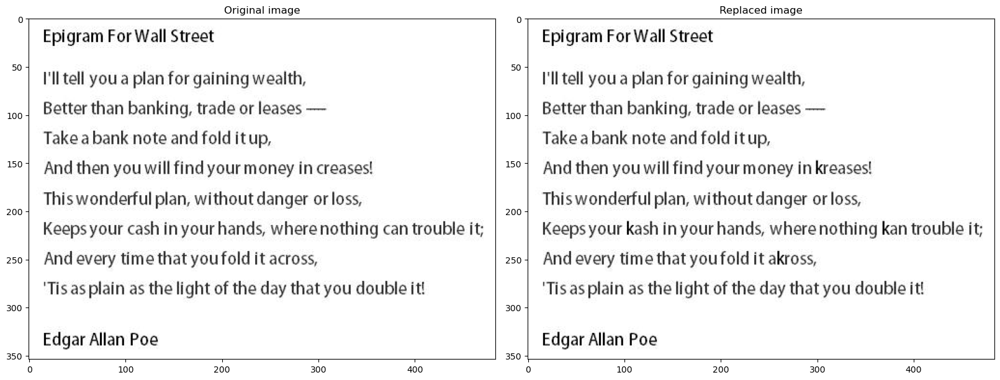

In [12]:
# load templates
c_template = io.imread('../c.jpg', as_gray=True)
k_template = io.imread('../k.jpg', as_gray=True)

# find c SSD
SSD_c = SSD(text, c_template)

# create threshold for c
c_threshold = (SSD_c * 1.3)

# replace c with k
replaced_img = replace_characters(text, c_template, k_template, c_threshold)

# show the images
fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,16))
title = "Original image"
axs[0].imshow(text, cmap="gray")
axs[0].set_title(title)
title = "Replaced image"
axs[1].imshow(replaced_img, cmap="gray")
axs[1].set_title(title)

## Part 3 - Edge Sharpening In Noisy Image

Loading the banana image

Text(0.5, 1.0, 'Bananas image.')

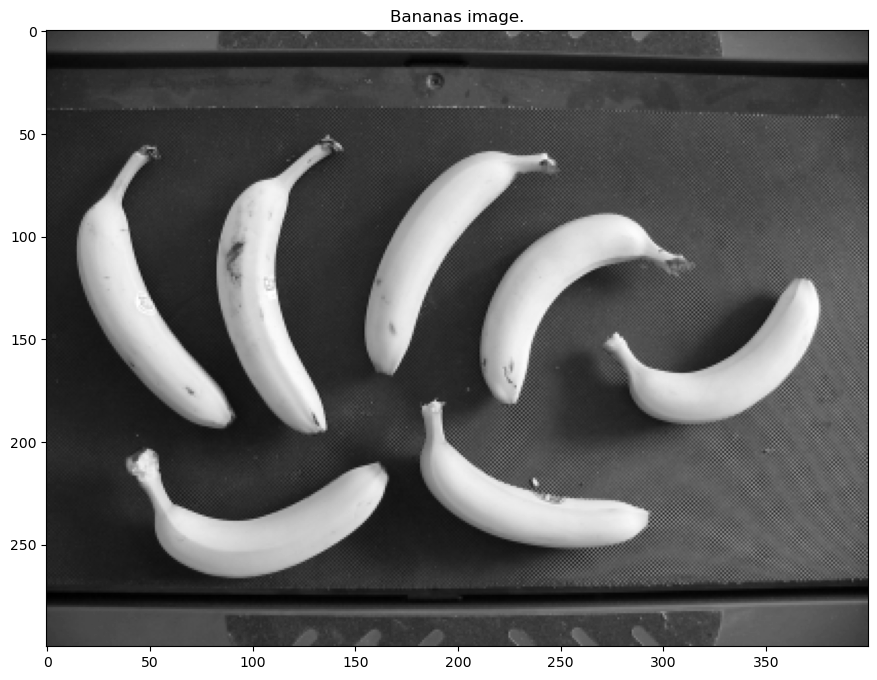

In [24]:
# load the image
bananas = io.imread('../bananas.jpg', as_gray=True)

# show the image
fig = plt.figure(figsize = (16,8))
title = "Bananas image."
plt.imshow(bananas, cmap="gray")
plt.title(title)

Apply edgde sharpening filter using filtering element:
$$h = 
 \begin{pmatrix}
  &0& & -\alpha & &0& \\
  & -\alpha & &1+4\alpha& & -\alpha& \\
  &0&  & -\alpha  & &0&  \\
 \end{pmatrix}$$
for multiple alphas

In [25]:
# creating the sharpening filter method
def sharpening_filter(img, alpha_list, alpha_corners = False):
    """applies the sharpening filter to the image for each alpha in the alpha list and plots the results"""
    # create the figure
    fig, axs = plt.subplots(1, len(alpha_list), figsize=(16, 16))
    for i, alpha in enumerate(alpha_list):
        h = np.zeros((3,3))
        h[0,1] = -alpha
        h[2,1] = -alpha
        h[1,0] = -alpha
        h[1,2] = -alpha
        h[1,1] = 1 + 4*alpha
        if alpha_corners:
            h[0,0] = -alpha
            h[0,2] = -alpha
            h[2,0] = -alpha
            h[2,2] = -alpha
            h[1,1] = 1 + 8*alpha
        img_filtered = nd.filters.convolve(img, h)
        img_filtered[img_filtered < 0] = 0
        img_filtered[img_filtered > 255] = 255
        img_filtered = img_filtered.astype(np.uint8)
        axs[i].imshow(img_filtered, cmap="gray")
        axs[i].set_title("Alpha = " + str(alpha))

C:\Users\yn_so\AppData\Local\Temp\ipykernel_15728\602895795.py:19: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  img_filtered = nd.filters.convolve(img, h)


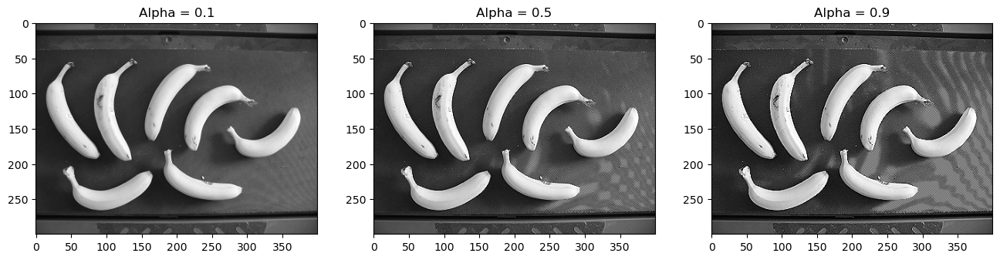

In [26]:
# apply the sharpening filter to the bananas image
alpha_list = [0.1, 0.5, 0.9]
sharpening_filter(bananas.astype(np.double), alpha_list)

Adding salt and pepper noise to the image and reapplying the edge sharpening with alpha = 0.2, 0.7

Text(0.5, 1.0, 'Bananas image with 3% salt and pepper noise.')

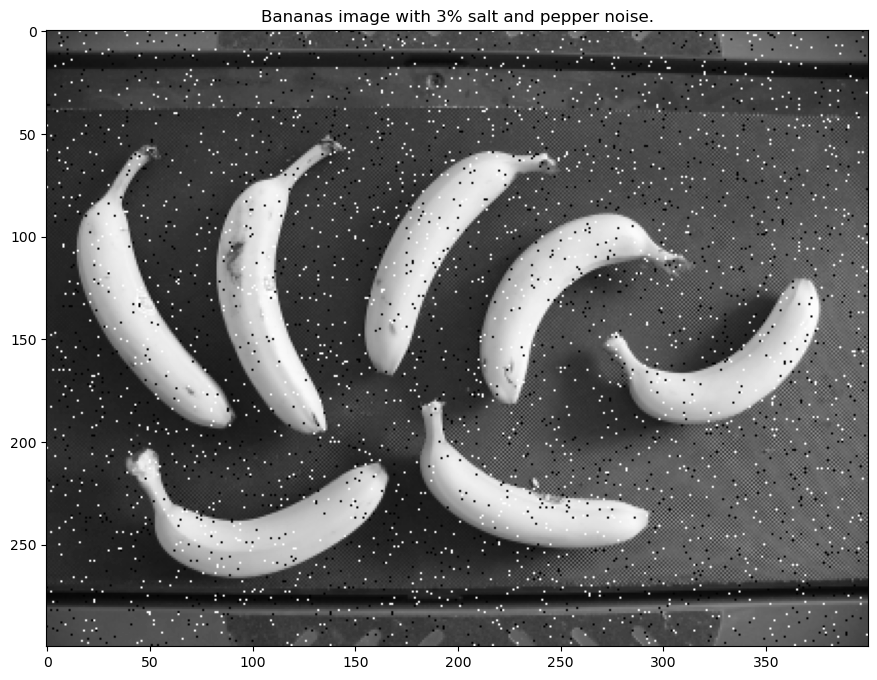

In [27]:
# add the noise to the image
bananas_salt_pepper = skimage.util.random_noise(bananas, mode='s&p', amount=0.03)

# show the image
fig = plt.figure(figsize = (16,8))
title = "Bananas image with 3% salt and pepper noise."
plt.imshow(bananas_salt_pepper, cmap="gray")
plt.title(title)

C:\Users\yn_so\AppData\Local\Temp\ipykernel_15728\602895795.py:19: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  img_filtered = nd.filters.convolve(img, h)


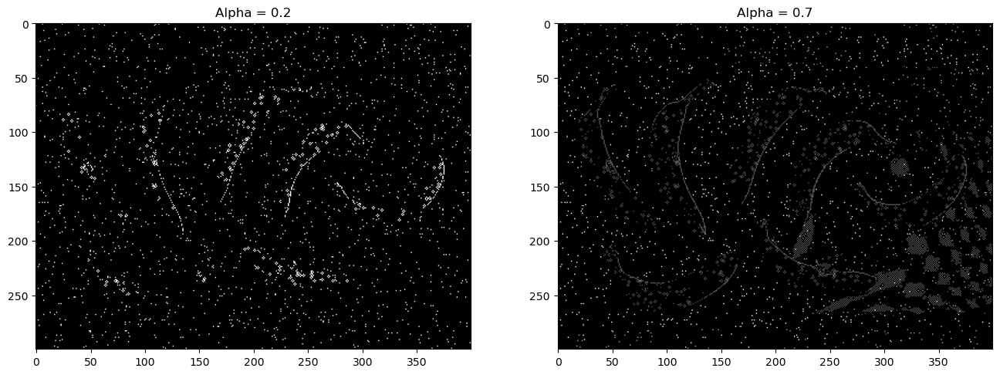

In [28]:
# apply the sharpening filter to the bananas image with noise
alpha_list = [0.2, 0.7]
sharpening_filter(bananas_salt_pepper, alpha_list)

Using median filter to eliminate the noise

C:\Users\yn_so\AppData\Local\Temp\ipykernel_15728\411298702.py:3: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  median_bananas = filters.rank.median(bananas_salt_pepper, footprint)
C:\Users\yn_so\AppData\Local\Temp\ipykernel_15728\602895795.py:19: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  img_filtered = nd.filters.convolve(img, h)


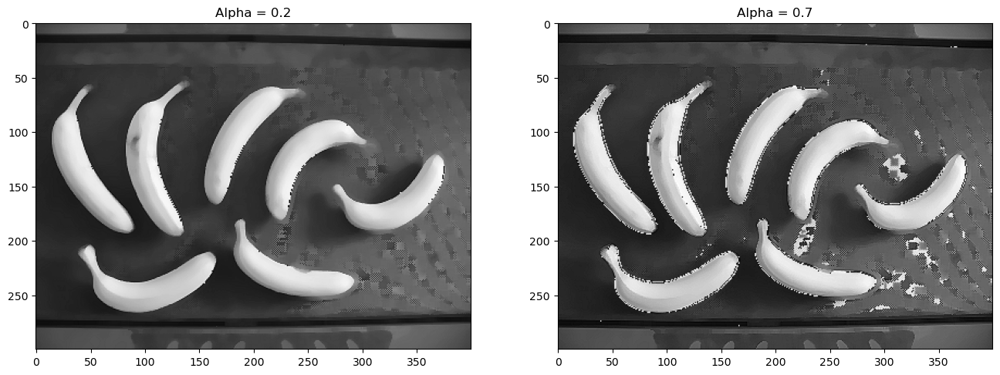

In [29]:
# creating and applying median filter
footprint = morphology.square(7)
median_bananas = filters.rank.median(bananas_salt_pepper, footprint)

# applying the sharpening filter to the median filtered image
alpha_list = [0.2, 0.7]
sharpening_filter(median_bananas, alpha_list)

Repeat the previous stages with gaussian noise with $ \mu = 0 $ and $ \sigma^2 = 0.003 $


Text(0.5, 1.0, 'Bananas image with gaussian var = 0.003 noise.')

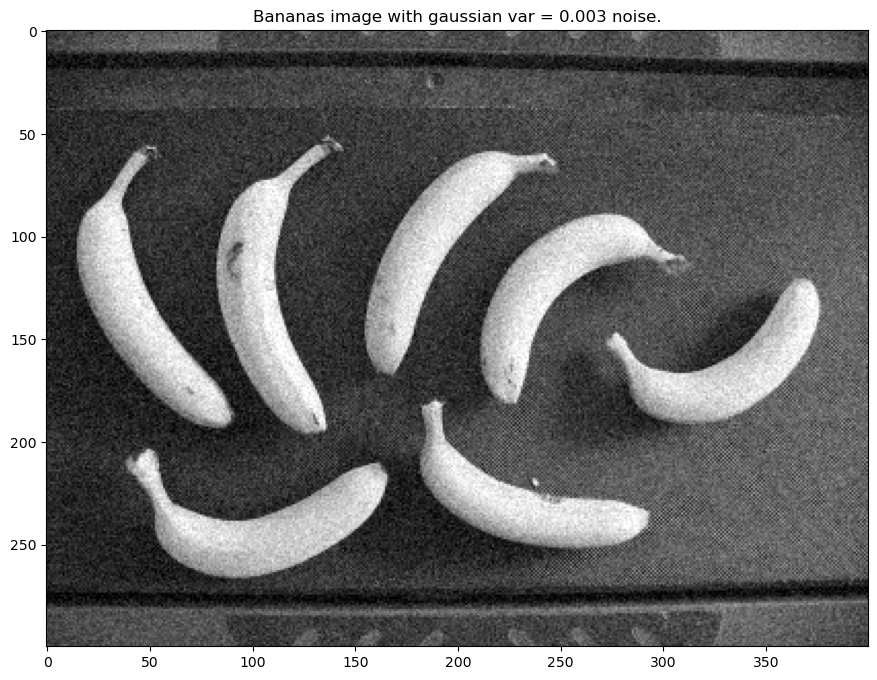

In [30]:
# add the noise to the image
bananas_gaussian = skimage.util.random_noise(bananas, mode='gaussian', var=0.003)

# show the image
fig = plt.figure(figsize = (16,8))
title = "Bananas image with gaussian var = 0.003 noise."
plt.imshow(bananas_gaussian, cmap="gray")
plt.title(title)

C:\Users\yn_so\AppData\Local\Temp\ipykernel_15728\602895795.py:19: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  img_filtered = nd.filters.convolve(img, h)


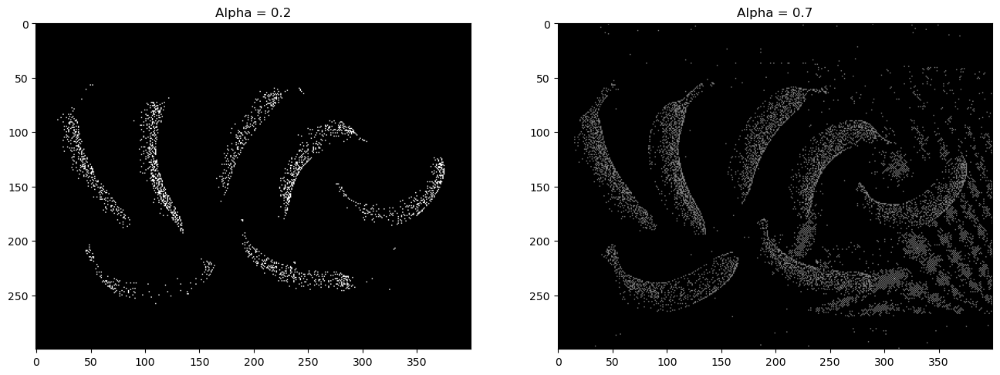

In [31]:
# apply the sharpening filter to the bananas image with noise
alpha_list = [0.2, 0.7]
sharpening_filter(bananas_gaussian, alpha_list)

Using median filter to eliminate noise

C:\Users\yn_so\AppData\Local\Temp\ipykernel_15728\1904737446.py:3: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  median_bananas = filters.rank.median(bananas_gaussian, footprint)
C:\Users\yn_so\AppData\Local\Temp\ipykernel_15728\602895795.py:19: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  img_filtered = nd.filters.convolve(img, h)


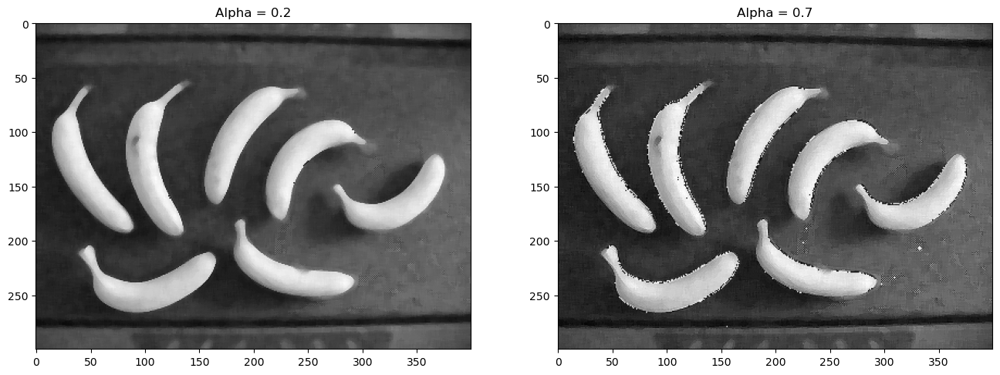

In [32]:
# creating and applying median filter
footprint = morphology.square(7)
median_bananas = filters.rank.median(bananas_gaussian, footprint)

# applying the sharpening filter to the median filtered image
alpha_list = [0.2, 0.7]
sharpening_filter(median_bananas, alpha_list)

Now, we will apply the following edge sharpening filter:
$$h = 
 \begin{pmatrix}
  &-\alpha& &-\alpha& &-\alpha& \\
  & -\alpha & &1+8\alpha& &-\alpha& \\
  & -\alpha & &-\alpha& &-\alpha&  \\
 \end{pmatrix}$$
and repeat the sharpening process of image with gaussian noise

C:\Users\yn_so\AppData\Local\Temp\ipykernel_15728\602895795.py:19: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  img_filtered = nd.filters.convolve(img, h)


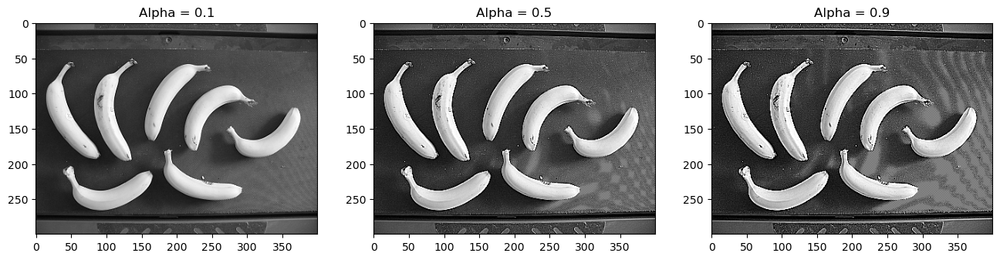

In [33]:
# apply the new sharpening filter to the bananas image
alpha_list = [0.1, 0.5, 0.9]
sharpening_filter(bananas.astype(np.double), alpha_list, alpha_corners=True)

C:\Users\yn_so\AppData\Local\Temp\ipykernel_15728\602895795.py:19: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  img_filtered = nd.filters.convolve(img, h)


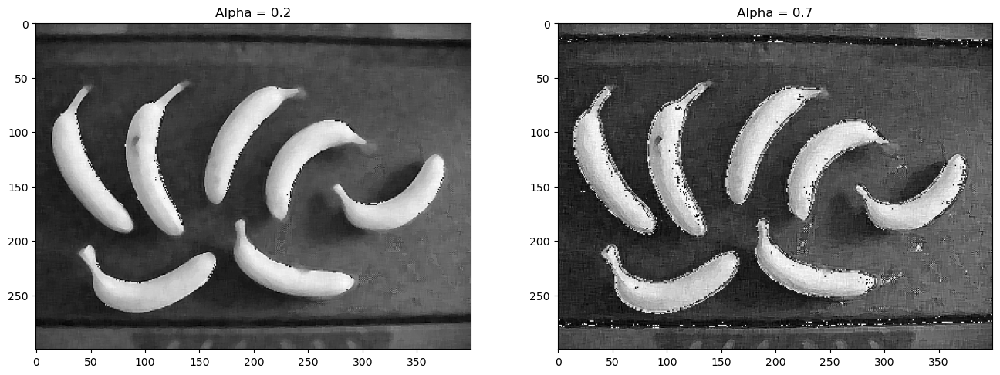

In [34]:
# applying the new sharpening filter to the median bananas image with gaussian noise
alpha_list = [0.2, 0.7]
sharpening_filter(median_bananas, alpha_list, alpha_corners=True)

## Part 4 - Pyramids

Creating Gaussian and Laplacian pyramids of 5 layers from a given image

In [13]:
def gaussian_pyramid(img):
    """Creating a gaussian pyramid for the input image"""
    # create the gaussian pyramid
    pyramid = [img]
    for i in range(5):
        img = skimage.transform.rescale(img, 0.5, anti_aliasing=True)
        pyramid.append(img)
    return pyramid

In [116]:
def laplacian_pyramid(img):
    """Creating a laplacian pyramid for the input image"""
    # create the gaussian pyramid
    gaussian_pyramid = [img]
    for i in range(5):
        img = skimage.transform.rescale(img, 0.5, anti_aliasing=True)
        gaussian_pyramid.append(img)
    # create the laplacian pyramid
    laplacian_pyramid = []
    for i in range(5):
        resized_img = skimage.transform.resize(gaussian_pyramid[i+1], (gaussian_pyramid[i].shape[0], gaussian_pyramid[i].shape[1]))
        laplacian_pyramid.append(gaussian_pyramid[i] - resized_img)
    return laplacian_pyramid

Creating a method that retrieves the original image from a Laplacian pyramid of 5 layers

In [73]:
def restore_from_laplacian_pyramid(laplacian_pyramid):
    """Restores the image from a 5 layer laplacian pyramid"""
    # restore the image
    restored_img = laplacian_pyramid[4]
    for i in range(3, -1, -1):
        # resize the restored image to the size of the next image in the laplacian pyramid
        resized_restored_img = skimage.transform.resize(restored_img, laplacian_pyramid[i].shape, anti_aliasing=True)
        # add the resized restored image to the next image in the laplacian pyramid
        restored_img = resized_restored_img + laplacian_pyramid[i]
    return restored_img


Apply the pyramids to Mandril.jpg and toucan.tif

Text(0.5, 1.0, 'Toucan image.')

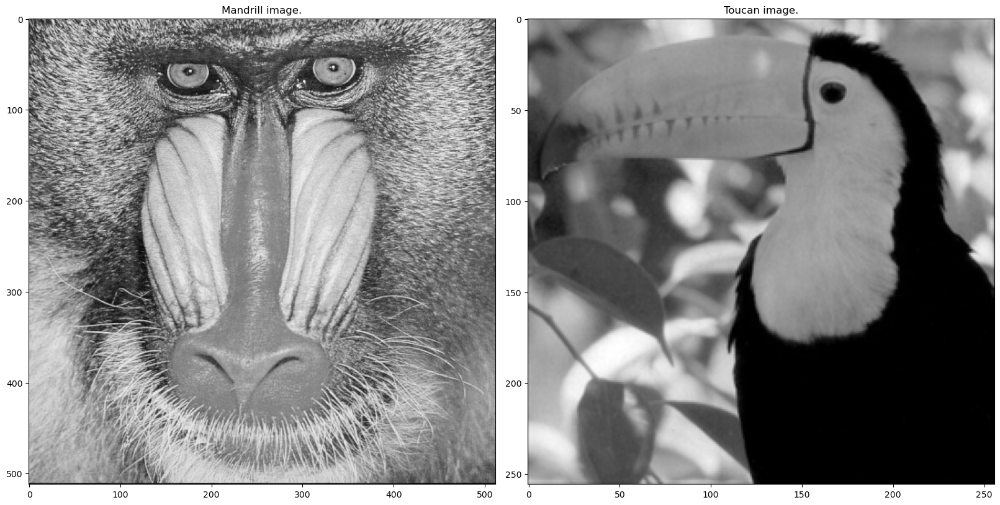

In [47]:
# load the images
mandrill = io.imread('../mandrill.jpg', as_gray=True)
toucan = io.imread('../toucan.tif', as_gray=True)

# show the images
fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,16))
title = "Mandrill image."
axs[0].imshow(mandrill, cmap="gray")
axs[0].set_title(title)
title = "Toucan image."
axs[1].imshow(toucan, cmap="gray")
axs[1].set_title(title)


In [117]:
# applyig pyramids to the mandrill image
mandrill_gaussian_pyramid = gaussian_pyramid(mandrill)
mandrill_laplacian_pyramid = laplacian_pyramid(mandrill)

# applyig pyramids to the toucan image
toucan_gaussian_pyramid = gaussian_pyramid(toucan)
toucan_laplacian_pyramid = laplacian_pyramid(toucan)

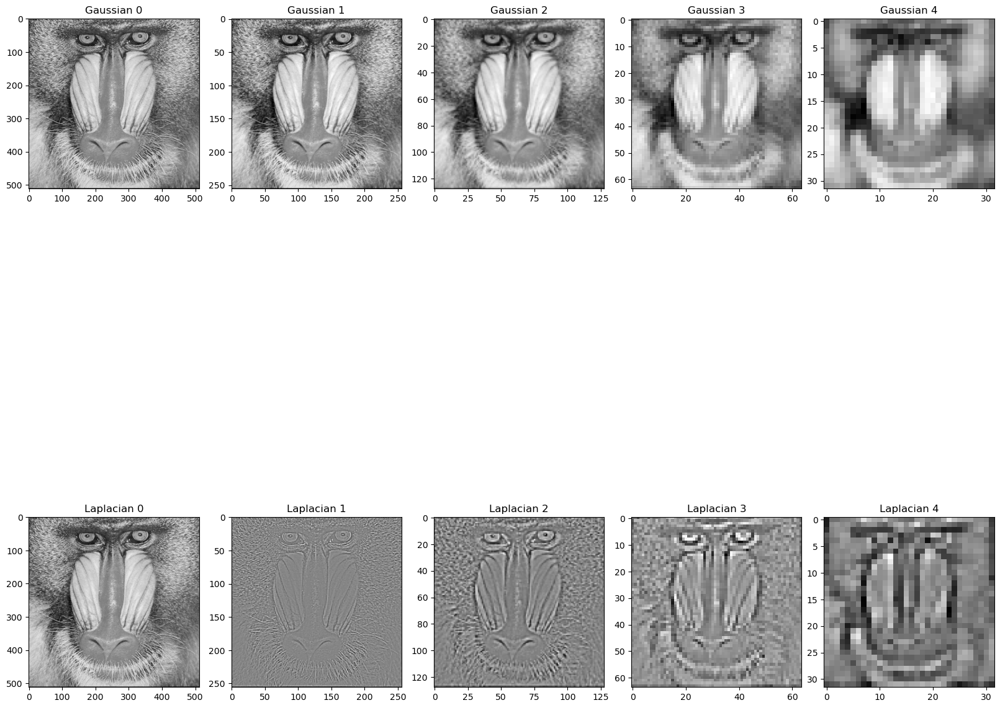

In [118]:
# show the gaussian and laplacian pyramids of the mandrill image
fig, axs = plt.subplots(2,5,constrained_layout=True,figsize = (16,16))
for i in range(5):
    axs[0,i].imshow(mandrill_gaussian_pyramid[i], cmap="gray")
    axs[0,i].set_title("Gaussian " + str(i))
    axs[1,i].imshow(mandrill_laplacian_pyramid[i], cmap="gray")
    axs[1,i].set_title("Laplacian " + str(i))

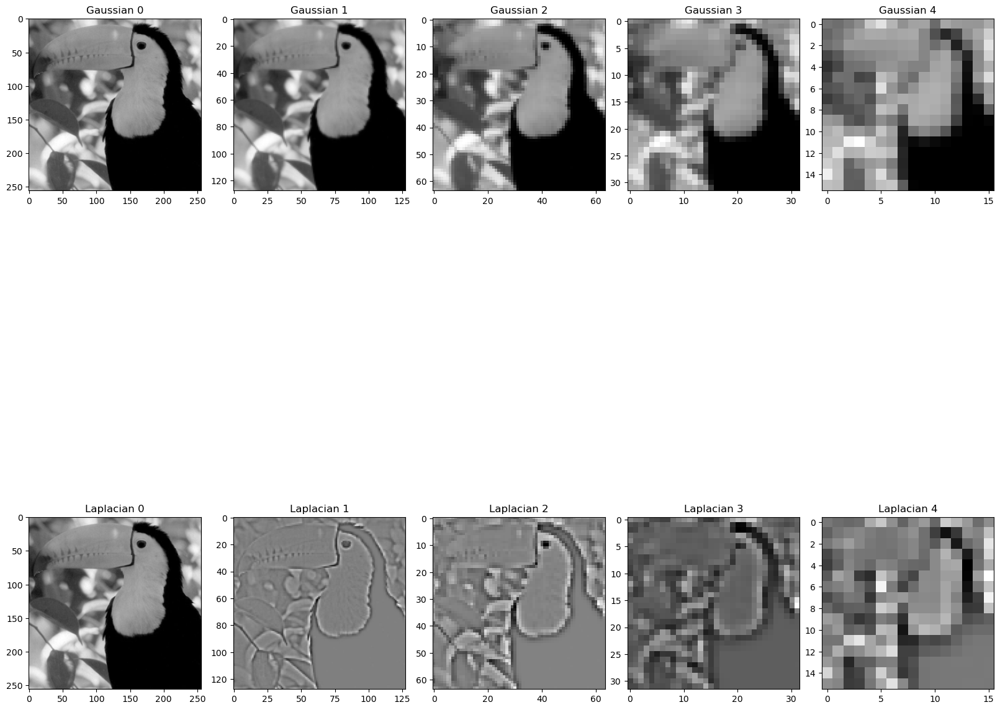

In [113]:
# show the gaussian and laplacian pyramids of the toucan image
fig, axs = plt.subplots(2,5,constrained_layout=True,figsize = (16,16))
for i in range(5):
    axs[0,i].imshow(toucan_gaussian_pyramid[i], cmap="gray")
    axs[0,i].set_title("Gaussian " + str(i))
    axs[1,i].imshow(toucan_laplacian_pyramid[i], cmap="gray")
    axs[1,i].set_title("Laplacian " + str(i))

Restoring the toucan and mandril image from the laplacian pyramid

Text(0.5, 1.0, 'Restored toucan image.')

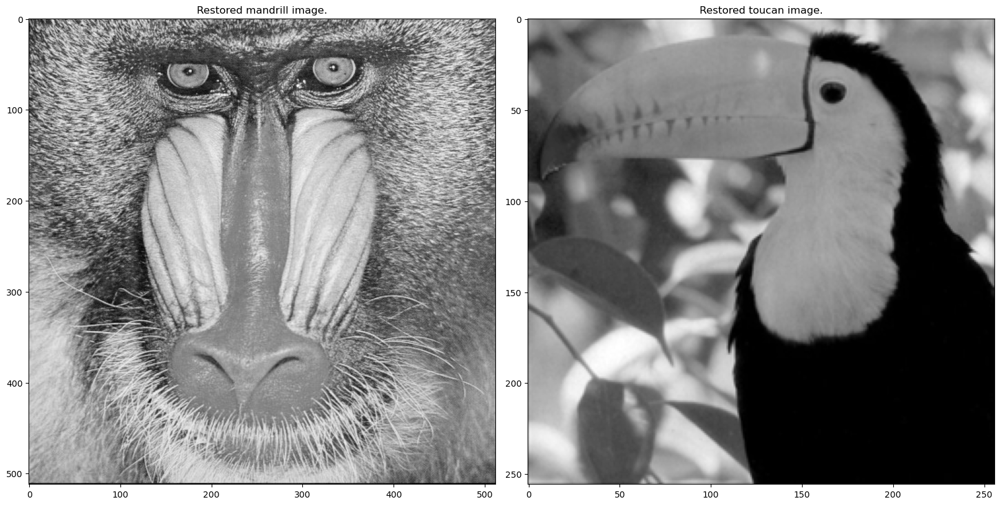

In [101]:
# restore the mandrill image from the laplacian pyramid
restored_mandrill = restore_from_laplacian_pyramid(mandrill_laplacian_pyramid)

# restore the tudan image from the lpaplacian pyramid
restored_toucan = restore_from_laplacian_pyramid(toucan_laplacian_pyramid)

# show the images
fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,16))
title = "Restored mandrill image."
axs[0].imshow(restored_mandrill, cmap="gray")
axs[0].set_title(title)
title = "Restored toucan image."
axs[1].imshow(restored_toucan, cmap="gray")
axs[1].set_title(title)

Creating an algorithm that improves the quality of an image using a 4 layered laplacian pyramid

In [114]:
def full_focus(img_focus1, img_focus2):
    """Takes the same image with two different focuses and creates a full focus image using a 4 layer laplacian pyramid"""
    # create the laplacian pyramids
    laplacian_pyramid_focus1 = laplacian_pyramid(img_focus1)
    laplacian_pyramid_focus2 = laplacian_pyramid(img_focus2)
    # create the full focus image
    full_focus_img = []
    for i in range(5):
        full_focus_img.append(np.maximum(laplacian_pyramid_focus1[i], laplacian_pyramid_focus2[i]))
    # restore the image
    restored_img = restore_from_laplacian_pyramid(full_focus_img)
    return restored_img

Text(0.5, 1.0, 'Focus 2 image.')

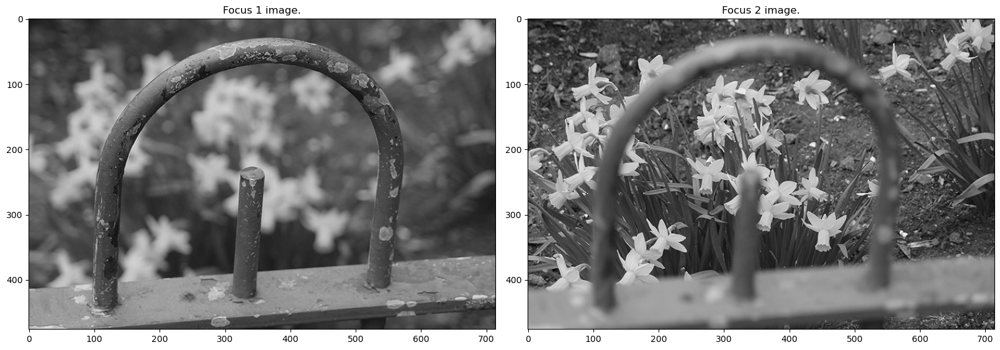

In [95]:
# load the images
focus1 = io.imread('../focus1.tif', as_gray=True)
focus2 = io.imread('../focus2.tif', as_gray=True)

# show the images
fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,16))
title = "Focus 1 image."
axs[0].imshow(focus1, cmap="gray")
axs[0].set_title(title)
title = "Focus 2 image."
axs[1].imshow(focus2, cmap="gray")
axs[1].set_title(title)

Text(0.5, 1.0, 'Full focus image.')

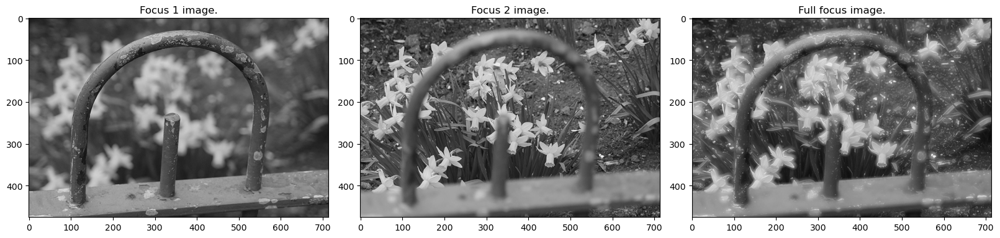

In [120]:
# create the full focus image
full_focus_img = full_focus(focus1, focus2)

# show the images
fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (16,16))
title = "Focus 1 image."
axs[0].imshow(focus1, cmap="gray")
axs[0].set_title(title)
title = "Focus 2 image."
axs[1].imshow(focus2, cmap="gray")
axs[1].set_title(title)
title = "Full focus image."
axs[2].imshow(full_focus_img, cmap="gray")
axs[2].set_title(title)

## Part 5 - Transformations

The following method performs 2D DCT to M*M blocks

In [34]:
from scipy.fft import dctn


def DCTcoeff(img, K):
    """Performs the DCT on the image where K is the number of blocks in each row or column
    and returns the matrix of the DCT coefficients"""
    # copy the image
    copy = img.copy()
    # calculate the size of the blocks
    block_size = int(img.shape[0] // K)
    for i in range(0, img.shape[0], block_size):
        for j in range(0, img.shape[1], block_size):
            # calculate the DCT of the block
            copy[i:i+block_size, j:j+block_size] = dctn(img[i:i+block_size, j:j+block_size], norm='ortho')

    return (copy*255).astype(np.uint8)

Applying the method on the Tiffany.jpg image

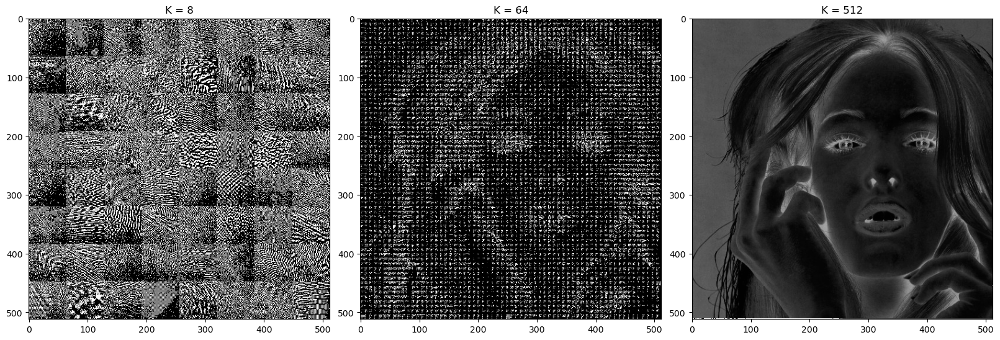

In [35]:
# load Tiffany image
tiffany = io.imread('../Tiffany.jpg', as_gray=True)

# K list
K_list = [8, 64, 512]

# DCT output list
DCT_coeff_list = []

# for each K in the list, calculate the DCT coefficients and show the outcome image
for K in K_list:
    # calculate the DCT coefficients
    DCT_coeff = DCTcoeff(tiffany, K)
    # append the DCT coefficients to the list
    DCT_coeff_list.append(DCT_coeff)

# show the images in one figure
fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (16,16))
for i in range(3):
    axs[i].imshow(DCT_coeff_list[i], cmap="gray")
    axs[i].set_title("K = " + str(K_list[i]))


The following method returns a 2D DCT transformation on M*M blocks and returns for each block just L highest coefficients and zeros the rest

In [77]:
def DCT_L_coeff(img, K, L):
    """returns a matrix of the DCT coefficients where the coefficients frequencies less than L are set to zero"""
    # copy the image
    copy = img.astype(np.float32) / 255
    # calculate the size of the blocks
    block_size = img.shape[0] // K
    for i in range(0, img.shape[0], block_size):
        for j in range(0, img.shape[1], block_size):
            # calculate the DCT of the block
            copy[i:i+block_size, j:j+block_size] = cv.dct(copy[i:i+block_size, j:j+block_size])
            # finding the L largest coefficients
            L_largest = np.sort(np.abs(copy[i:i+block_size, j:j+block_size]), axis=None)[-L]
            # keeping only the coefficients larger than L_largest
            copy[i:i+block_size, j:j+block_size] = copy[i:i+block_size, j:j+block_size] * (np.abs(copy[i:i+block_size, j:j+block_size] >= L_largest))
    return copy

The next method returns the inverse 2D DCT method

In [75]:
def iDCT(C, K):
    """performs the inverse DCT on the matrix of the DCT coefficients and returns the restored image"""
    # copy the image
    copy = C.copy()
    # calculate the size of the blocks
    block_size = int(C.shape[0] // K)
    for i in range(0, C.shape[0], block_size):
        for j in range(0, C.shape[1], block_size):
            # calculate the inverse DCT
            copy[i:i+block_size, j:j+block_size] = cv.idct(copy[i:i+block_size, j:j+block_size])
    
    return (copy*255).astype(np.uint8)

Text(0.5, 1.0, 'iDCT with K = 64, L = 16')

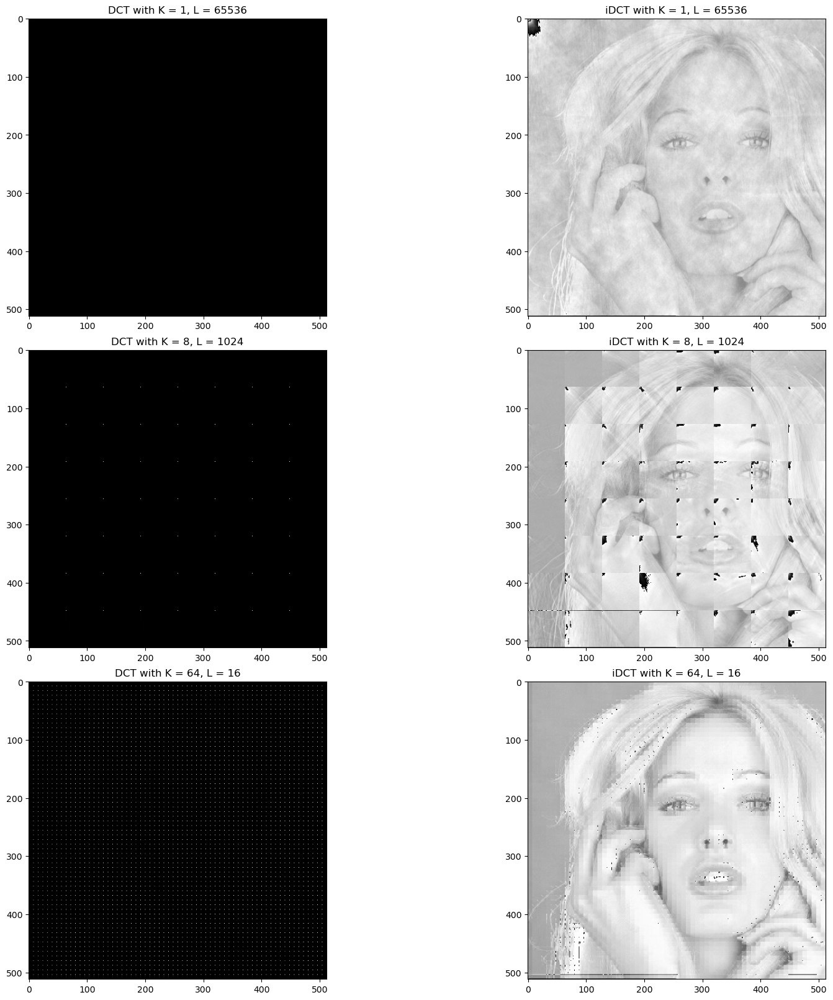

In [82]:
# Applying DCT_L_coeff on Tiffany.jpg such that only N^2/4 coefficients are non-zero
K_list = [1, 8, 64]
L_list = [((tiffany.shape[0] // K) ** 2) // 4 for K in K_list] 
returned_img = []
reverserd_returned_img = []

for i in range(len(K_list)):
    # calculate the DCT coefficients
    DCT_coeff = DCT_L_coeff(tiffany, K_list[i], L_list[i])
    # append the DCT coefficients to the list
    returned_img.append(DCT_coeff)
    # calculate the inverse DCT
    iDCT_coeff = iDCT(DCT_coeff, K_list[i])
    # append the inverse DCT coefficients to the list
    reverserd_returned_img.append(iDCT_coeff)

# show all images, both in returned and reversed_returned in one figure
fig, axs = plt.subplots(3,2,constrained_layout=True,figsize = (16,16))
title = "DCT with K = " + str(K_list[0]) + ", L = " + str(L_list[0])
axs[0,0].imshow(returned_img[0], cmap="gray")
axs[0,0].set_title(title)
title = "iDCT with K = " + str(K_list[0]) + ", L = " + str(L_list[0])
axs[0,1].imshow(reverserd_returned_img[0], cmap="gray")
axs[0,1].set_title(title)
title = "DCT with K = " + str(K_list[1]) + ", L = " + str(L_list[1])
axs[1,0].imshow(returned_img[1], cmap="gray")
axs[1,0].set_title(title)
title = "iDCT with K = " + str(K_list[1]) + ", L = " + str(L_list[1])
axs[1,1].imshow(reverserd_returned_img[1], cmap="gray")
axs[1,1].set_title(title)
title = "DCT with K = " + str(K_list[2]) + ", L = " + str(L_list[2])
axs[2,0].imshow(returned_img[2], cmap="gray")
axs[2,0].set_title(title)
title = "iDCT with K = " + str(K_list[2]) + ", L = " + str(L_list[2])
axs[2,1].imshow(reverserd_returned_img[2], cmap="gray")
axs[2,1].set_title(title)

Showing the difference between the original image and the iDCT image

In [85]:
def diff(img, restored_img):
    """returns the difference between the original image and the restored image"""
    return img - restored_img

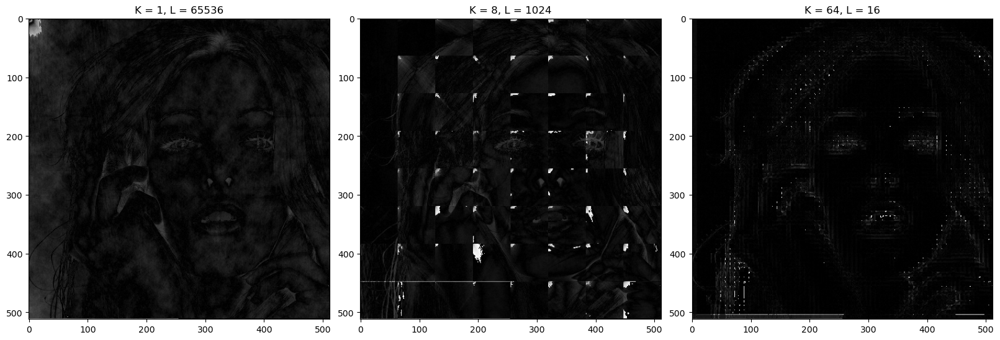

In [87]:
# calculate the difference between the original image and the restored image
diff_list = [diff(tiffany, reverserd_returned_img[i]) for i in range(len(K_list))]

# show the difference between the original image and the restored image
fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (16,16))
for i in range(3):
    axs[i].imshow(np.abs(tiffany.astype(np.float32) - reverserd_returned_img[i].astype(np.float32)), cmap="gray")
    axs[i].set_title("K = " + str(K_list[i]) + ", L = " + str(L_list[i]))

Calculating the MSE between the origianl image and the restored image for k=[1, 2, 4, 8, 16, 64, 128, 256]

In [93]:
def MSE(img, restored_img):
    """returns the MSE between the original image and the restored image"""
    return np.mean((restored_img.astype(np.float32) - img.astype(np.float32)) ** 2)


Text(0.5, 1.0, 'MSE vs K')

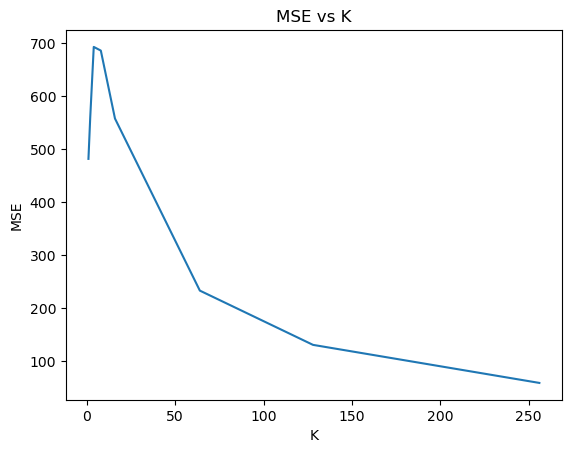

In [94]:
# calculate the MSE between the original image and the restored image
K_list = [1, 2, 4, 8, 16, 64, 128, 256]
L_list = [((tiffany.shape[0] // K) ** 2) // 4 for K in K_list]
MSE_list = []

for i in range(len(K_list)):
    # calculate the DCT coefficients
    DCT_coeff = DCT_L_coeff(tiffany, K_list[i], L_list[i])
    # calculate the inverse DCT
    iDCT_coeff = iDCT(DCT_coeff, K_list[i])
    # calculate the MSE
    MSE_list.append(MSE(tiffany, iDCT_coeff))

# plot a graph of MSE vs K
plt.plot(K_list, MSE_list)
plt.xlabel("K")
plt.ylabel("MSE")
plt.title("MSE vs K")
